In [1]:
### todos ###
# create a function that takes id and feature 
# draws black and red

from functions.paperFunctions import *
from functions.modelExploring import *
from functions.FaCells import FaCellsProject

#in_dir = '/Volumes/Hitachi/dataFacells'
in_dir = '/Users/xaviergonzalez/Library/Mobile Documents/com~apple~CloudDocs/Documents/Art/AI experiments/deepFaceDraw/FaCells/data/'
out_dir = '/Volumes/Hitachi/noviembre_electronico/'

facellsProject = FaCellsProject('absolute-sorted',in_dir)
facellsProject.loadModel("modelX.h5", in_dir)
facellsProject.loadPredictions()
facellsProject.model.summary()

#plotOneFeature(6,1000, 8, facellsProject)

Metal device set to: Apple M1 Pro


2022-12-16 17:58:56.050372: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:306] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2022-12-16 17:58:56.050397: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:272] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input (InputLayer)          [(None, None, 3)]         0         
                                                                 
 bi1 (Bidirectional)         (None, None, 256)         135168    
                                                                 
 bi2 (Bidirectional)         (None, None, 256)         394240    
                                                                 
 bi3 (Bidirectional)         (None, None, 256)         394240    
                                                                 
 global_average_pooling1d_1   (None, 256)              0         
 (GlobalAveragePooling1D)                                        
                                                                 
 do (Dropout)                (None, 256)               0         
                                                           

In [2]:
def plotOneFeature(featureId, nDraws, threshold, facellsProject, outputDir = 'output', 
                   invertedFeature = False, frame=False,alpha_=0.15, linewidth=2,color="black"):
    
    #print(facellsProject.columnNames[featureId])
    #try:

    rowIds = facellsProject.selectNDraws(nDraws, feature=featureId, invertedFeature = invertedFeature)
    xMax = 362
    yMax = 442
    fig = plt.figure(
            figsize=(xMax/30,yMax/30))


    
    for rowId in rowIds:

        length = facellsProject.yPredDfFull.loc[rowId,'length']
        rowIdDct = facellsProject.yPredDfFull.loc[rowId,'rowId']

        draw = facellsProject.Xdct[length][rowIdDct]
        draw = draw.reshape(1,draw.shape[0],3)
        if len(facellsProject.drawWeightsDct[length].shape)==2:
            drawWeightsDctFixed = facellsProject.drawWeightsDct[length][np.newaxis,:,:]
        else:
            drawWeightsDctFixed = facellsProject.drawWeightsDct[length]
        draw_weights = np.squeeze(np.asarray(drawWeightsDctFixed[rowIdDct,:,featureId]))
        plotOneRecord3D_weigths(draw[0], draw_weights, threshold, lowerOrEqual = invertedFeature, show=False,
                               alpha_=alpha_, linewidth = linewidth,color = color)
        #plotOneRecord3D_weigths(draw[0], [10 for i in range(len(draw[0]))], threshold, lowerOrEqual = False, show=False)

    if frame:
        x_lim = [-88, 88-1, 88-1,-88,-88]
        y_lim = [-108+1+1,-108+1+1, 108,108,-108+1+1]
        
        #randomize frame
        n_borders = random.sample([2,2,2,3],1)
        if n_borders[0] == 2:
            trace_border = [True,True,False,False]
        else:
            trace_border = [True,True,True,False]
        random.shuffle(trace_border)
        for i in range(4):
            if trace_border[i]:
                plt.plot(x_lim[i:i+2],y_lim[i:i+2],"-",alpha=alpha_, color=color,linewidth=linewidth)
                
    plt.savefig(outputDir + '/' + str(featureId) + '-' + str(nDraws) + '-' + str(threshold) + '.pdf' )#,
               #bbox_inches='tight')  
    #except:
    #    print('error')

#Python 3

In [3]:
attribute_list = [('5_o_Clock_Shadow',16),
 ('Arched_Eyebrows',12),
 ('Attractive',8),
 ('Bags_Under_Eyes',10),
 ('Bald',19),
 ('Bangs',20),
 ('Big_Lips',7),
 ('Big_Nose',11),
 ('Black_Hair',8),
 ('Blond_Hair',16),
 ('Blurry',10),
 ('Brown_Hair',8),
 ('Bushy_Eyebrows',9),
 ('Chubby',10),
 ('Double_Chin',12),
 ('Eyeglasses',26),
 ('Goatee',18),
 ('Gray_Hair',14),
 ('Heavy_Makeup',14),
 ('High_Cheekbones',12),
 ('Male',23),
 ('Mouth_Slightly_Open',14),
 ('Mustache',20),
 ('Narrow_Eyes',8),
 ('No_Beard',14),
 ('Oval_Face',10),
 ('Pale_Skin',13),
 ('Pointy_Nose',10),
 ('Receding_Hairline',10),
 ('Rosy_Cheeks',15),
 ('Sideburns',22),
 ('Smiling',17),
 ('Straight_Hair',8),
 ('Wavy_Hair',8),
 ('Wearing_Earrings',12),
 ('Wearing_Hat',24),
 ('Wearing_Lipstick',14),
 ('Wearing_Necklace',9),
 ('Wearing_Necktie',15),
 ('Young',9)]

In [4]:
facellsProject.drawWeightsDct

{488: array([[[-2.38015950e-02, -5.57194042e+00, -2.71821046e+00, ...,
          -3.90349102e+00,  2.69722319e+00, -1.06778669e+00],
         [ 7.29937077e-01, -7.58184147e+00, -4.75461197e+00, ...,
          -5.04316044e+00,  4.79764986e+00, -2.24788713e+00],
         [ 1.02399814e+00, -9.11076355e+00, -6.37492895e+00, ...,
          -5.90066576e+00,  6.09859848e+00, -3.03538799e+00],
         ...,
         [ 6.93666410e+00, -8.15760136e+00, -8.94937801e+00, ...,
           1.87372416e-01,  3.83327222e+00, -2.59939718e+00],
         [ 5.69169807e+00, -6.81065321e+00, -8.09268951e+00, ...,
           3.56505483e-01,  3.55158830e+00, -2.88883948e+00],
         [ 3.52590966e+00, -5.10875463e+00, -6.85222435e+00, ...,
           5.02042294e-01,  2.70604348e+00, -3.26166177e+00]],
 
        [[ 7.74358034e+00, -7.66449451e+00, -6.97826815e+00, ...,
          -5.04605913e+00,  2.19171953e+00,  1.42743123e+00],
         [ 1.06110163e+01, -1.06070900e+01, -9.63666058e+00, ...,
          -6.880

not generated:Blurry
not generated:Brown_Hair


/var/folders/nq/s6slfn1s0zg_937bz8870x900000gn/T/ipykernel_68104/2432295558.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(


not generated:Narrow_Eyes
not generated:Pale_Skin


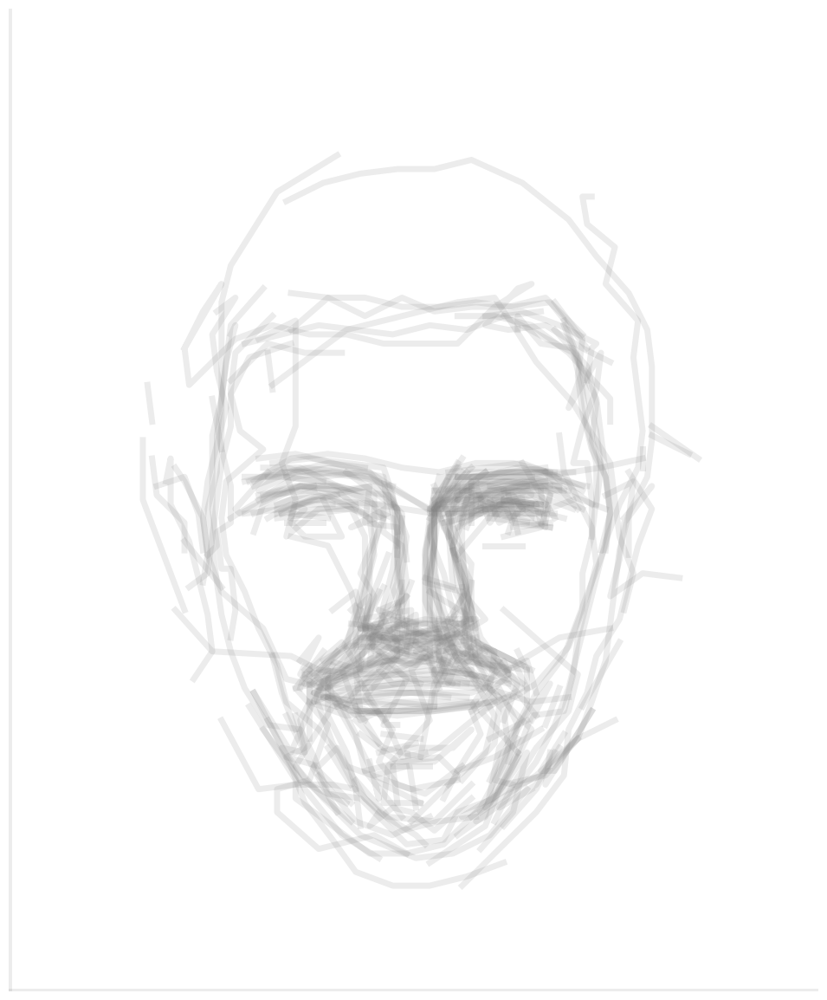

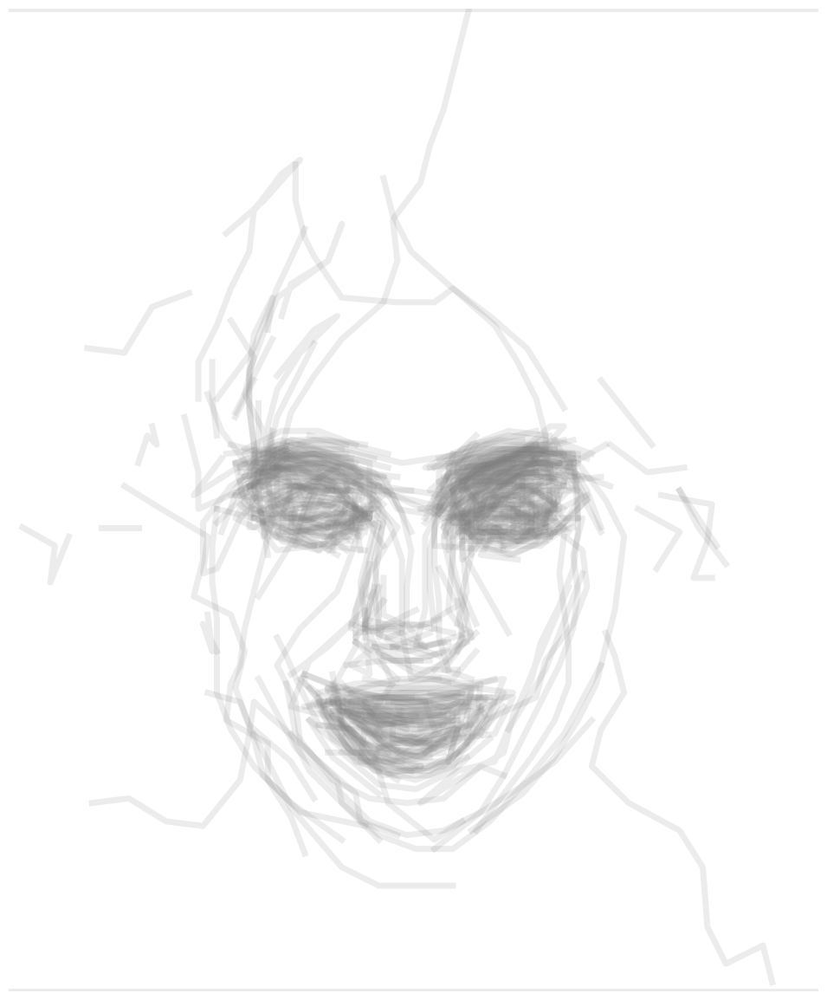

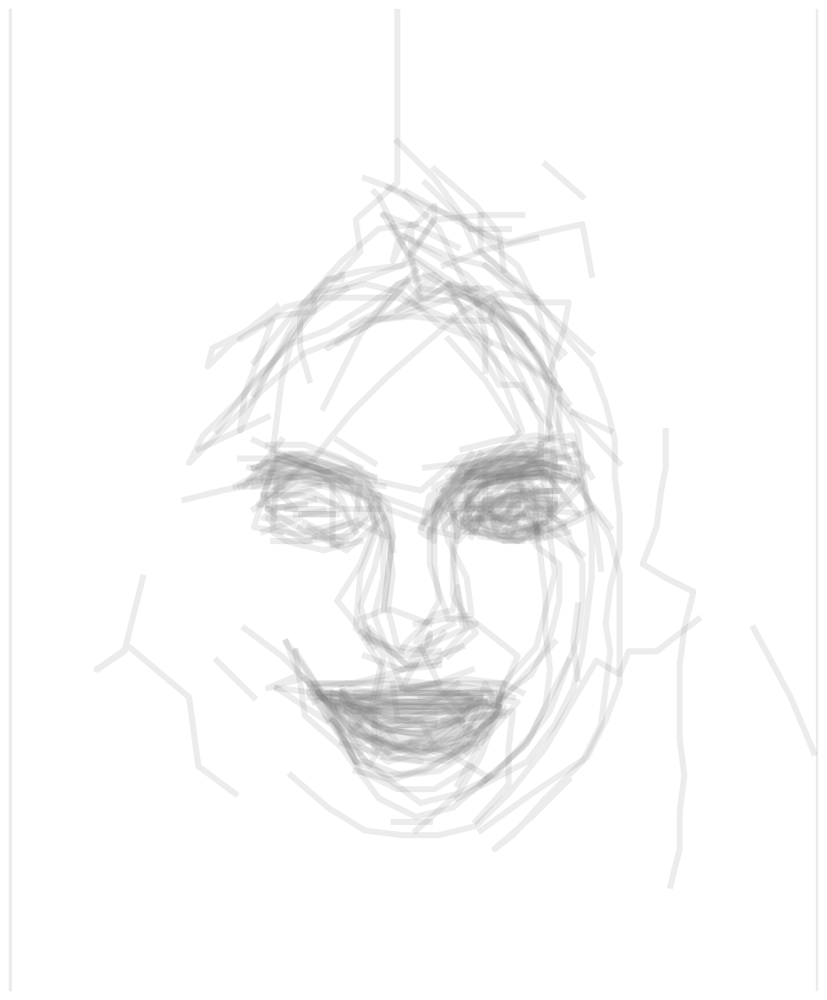

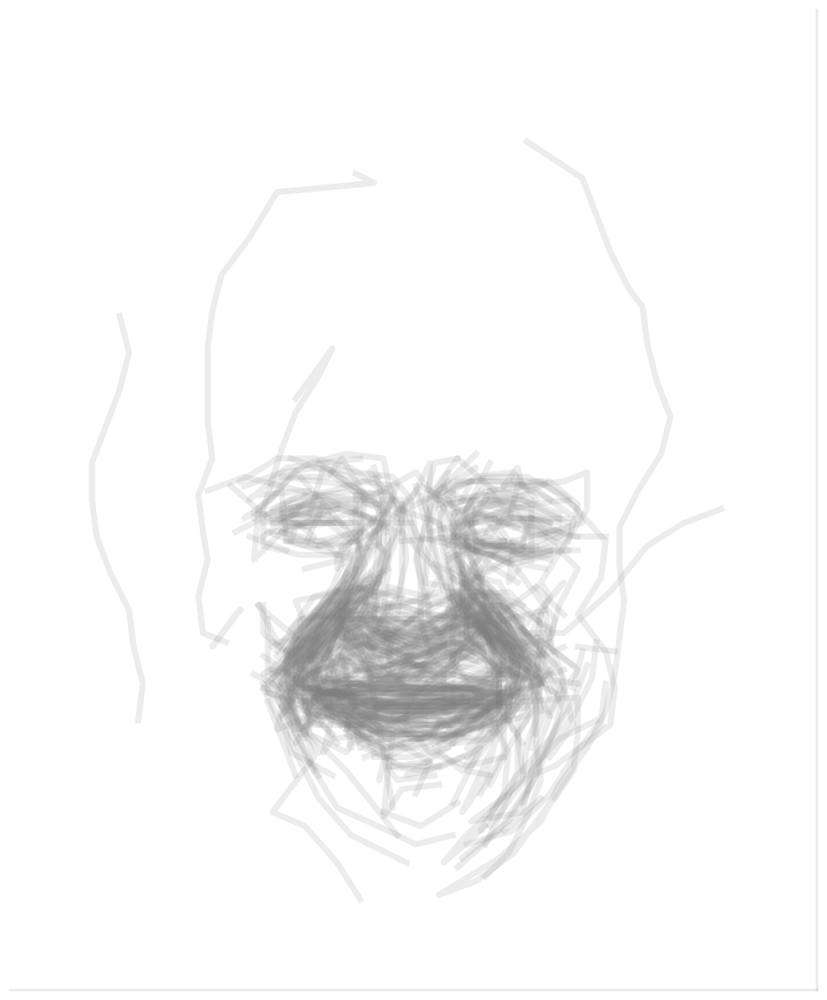

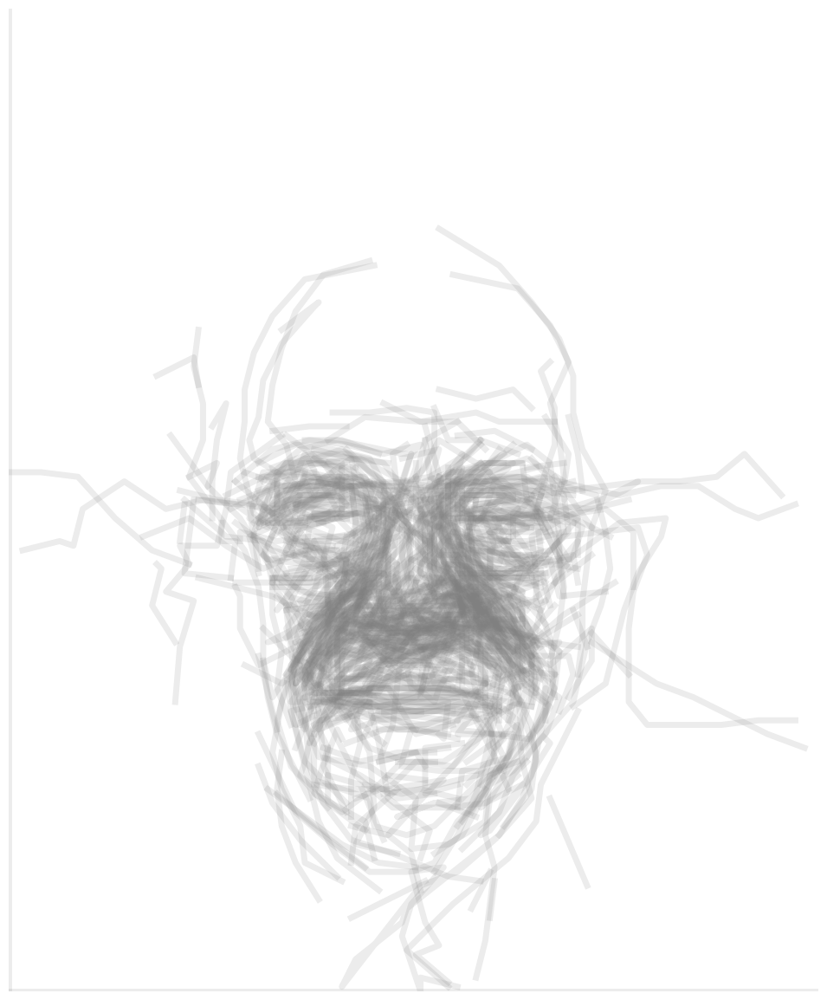

...

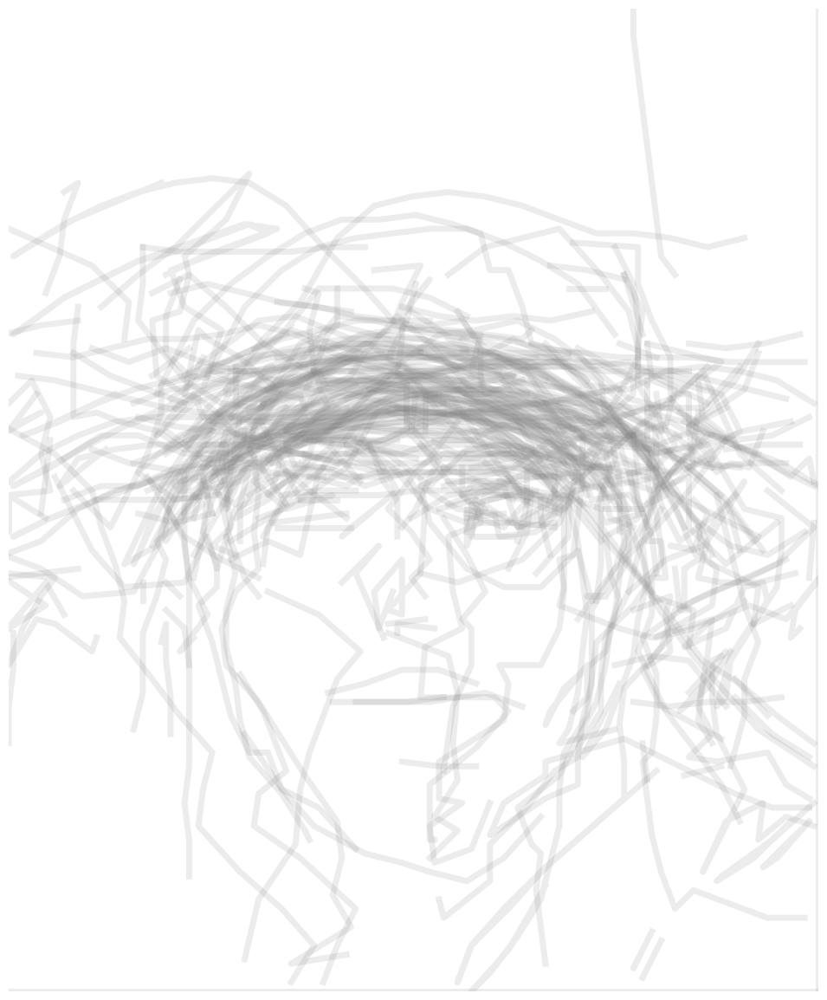

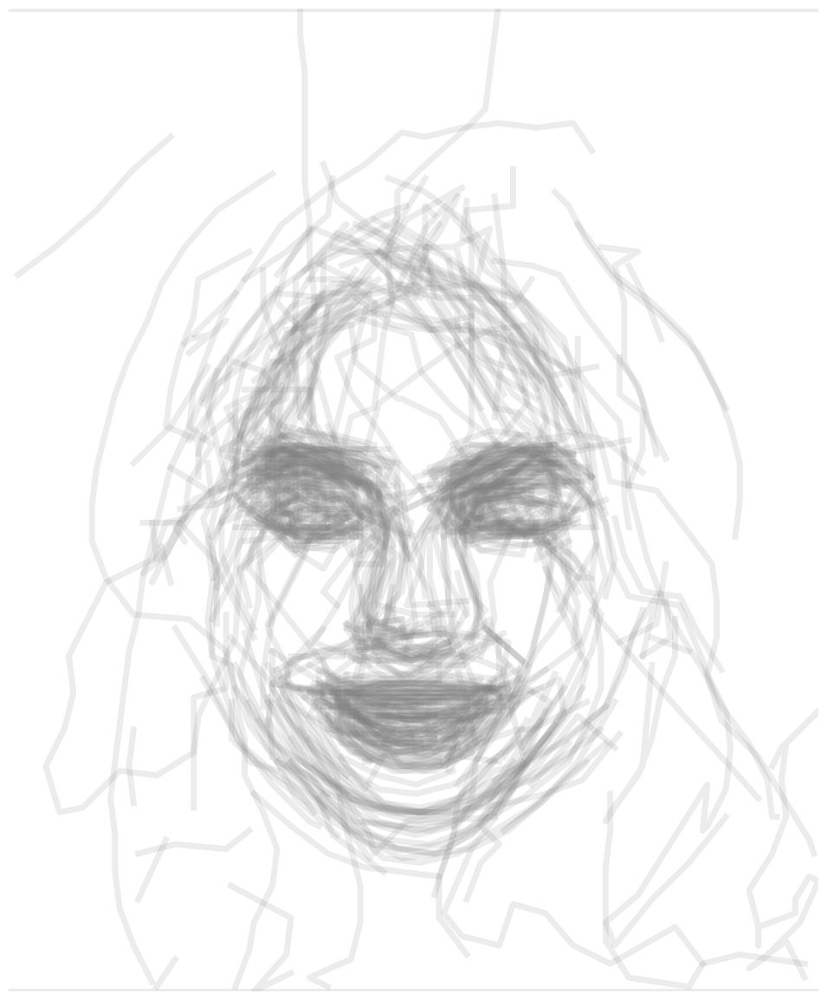

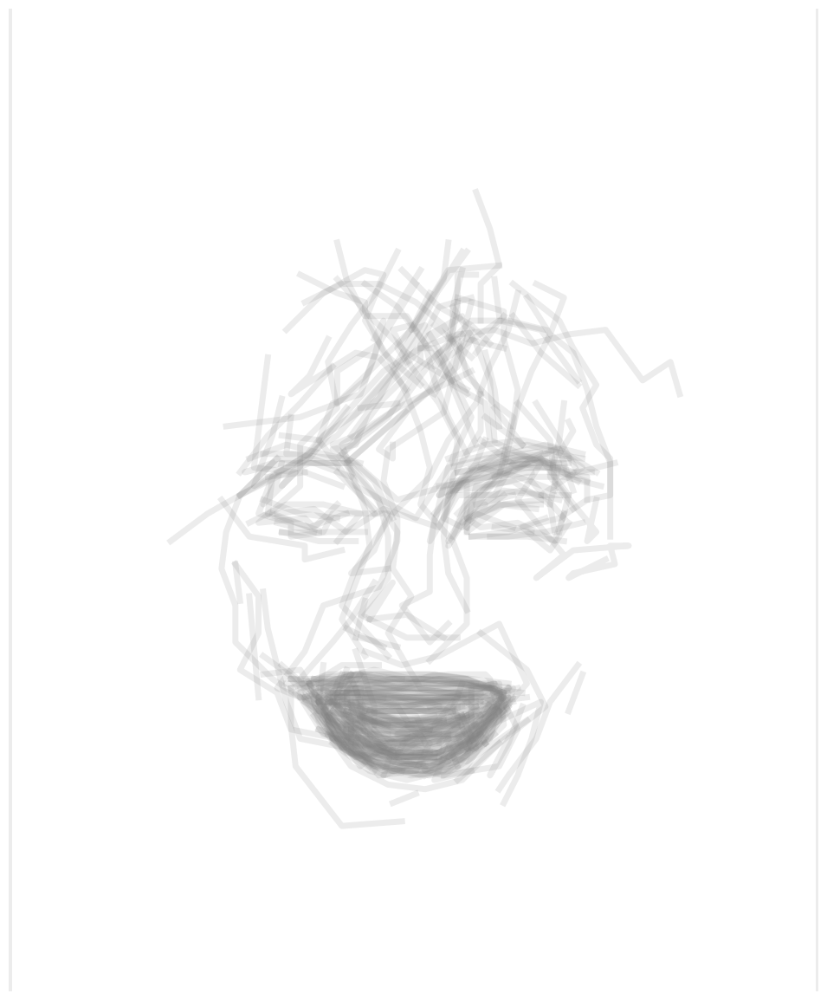

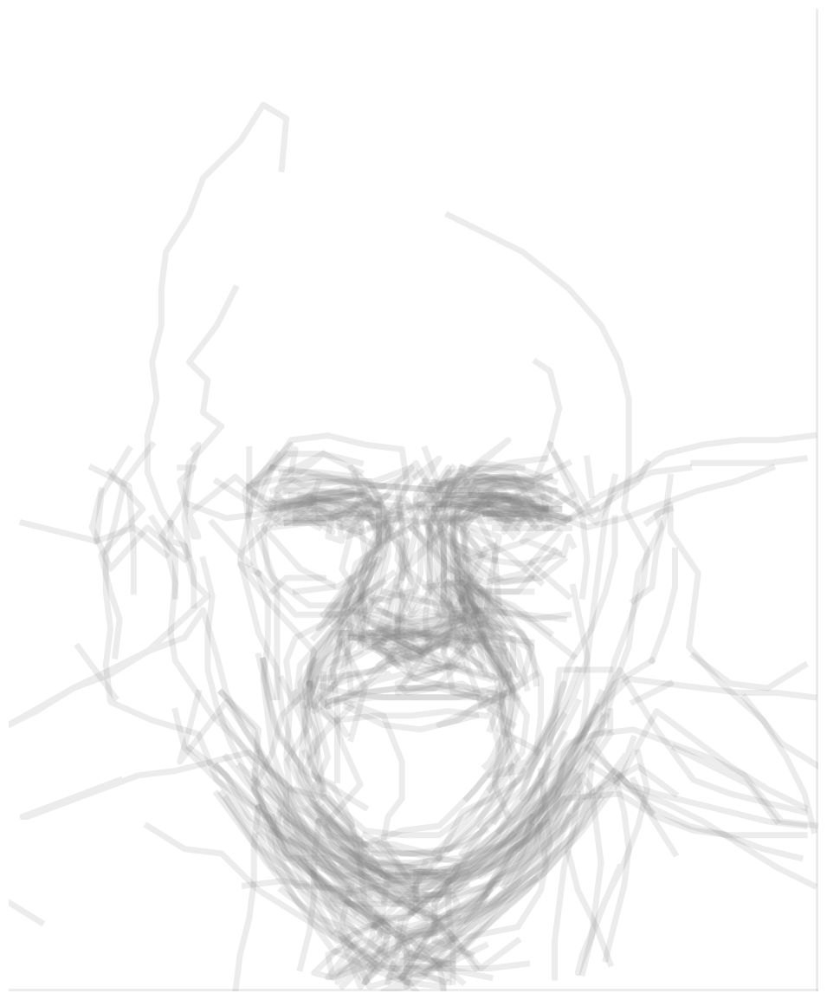

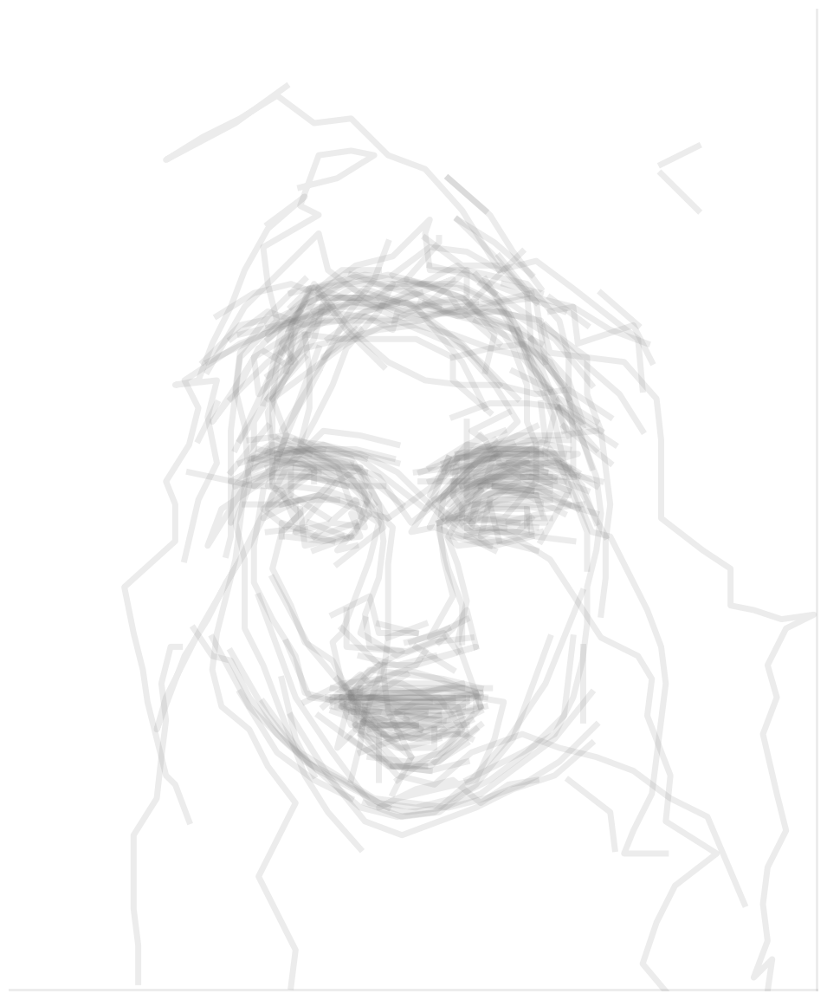

In [6]:
import random
for i in range(len(attribute_list)):
    try:
        #attribute_list[i][1]
        plotOneFeature(i, 62, attribute_list[i][1], facellsProject, outputDir = 'noviembre_electronico', invertedFeature = False, 
                       frame=True,alpha_=0.15, linewidth=5,color='gray')
    except:
        print('not generated:' + attribute_list[i][0])
    

In [ ]:
for att in range(40):
    thres = attribute_list[att][1]
    plotOneFeature(att, 230, thres, facellsProject, outputDir = 'noviembre_electronico', invertedFeature = False, frame=True)

In [ ]:
[0,1,2]+1


In [ ]:
import random
n_clones = 5

negative = 'both'
epsilon = 1/n_clones


n_draws_list = [40,39]
delta_thres = [-0.5,0.5]



for i in range(n_clones):
    for j in range(40):#range(40):#[2,18,19,36]:#[31]:#[1,6,12,15,16,18,29,31,35]: #range(40):
        idx = random.choice([0,1])
        n_draws = n_draws_list[idx]
        delta = delta_thres[idx]
        delta2 = random.choice([-1,1])
        
        if negative != 'negative':
            try:
                plotOneFeature(j,n_draws
                               ,attribute_list[j][1] + i*epsilon +delta + delta2 +0.033000001
                               #,43+ i*epsilon
                               , facellsProject
                               , outputDir = '/Volumes/Hitachi/noviembre_electronico', invertedFeature = False, frame=True
                      ,alpha_=0.5, linewidth=2,color='black')
            except:
                print('not generated:' + attribute_list[i][0])   
        if negative != 'positive':
            try:
                plotOneFeature(j,n_draws , -attribute_list[j][1]  - i*epsilon - delta -delta2+i*2+0.5+0.03300001, facellsProject, outputDir = '/Volumes/Hitachi/noviembre_electronico', invertedFeature = True, frame=True
                     ,alpha_=0.5, linewidth=2,color='black') 
            except:
                print('not generated:' + attribute_list[i][0])

In [ ]:
ids = [1,2,5,9,15,18,19,20,21,24,31,33,35,36,39]

In [ ]:
[('5_o_Clock_Shadow',0)
 ('Arched_Eyebrows',1)
 ('Attractive',8)
 ('Bags_Under_Eyes',14)
 ('Bald',
 ('Bangs',5
 ('Big_Lips',
 ('Big_Nose',
 ('Black_Hair',
 ('Blond_Hair',9
 ('Blurry',
 ('Brown_Hair',
 ('Bushy_Eyebrows',12
 ('Chubby',
 ('Double_Chin',
 ('Eyeglasses',15
 ('Goatee',
 ('Gray_Hair',
 ('Heavy_Makeup',18
 ('High_Cheekbones',19
 ('Male',20
 ('Mouth_Slightly_Open',21
 ('Mustache',
 ('Narrow_Eyes',
 ('No_Beard',24
 ('Oval_Face',
 ('Pale_Skin',
 ('Pointy_Nose',
 ('Receding_Hairline',28
 ('Rosy_Cheeks',
 ('Sideburns',
 ('Smiling',31
 ('Straight_Hair',
 ('Wavy_Hair',33
 ('Wearing_Earrings',
 ('Wearing_Hat',35
 ('Wearing_Lipstick',36
 ('Wearing_Necklace',
 ('Wearing_Necktie',
 ('Young',39)]

In [ ]:
#eyeglasses
ids_eye = facellsProject.selectNDraws( nDraws=1000, feature=15, invertedFeature = False)
ids_smiling = facellsProject.selectNDraws( nDraws=1000, feature=31, invertedFeature = False)

In [ ]:

from functions.paperFunctions import *

In [ ]:
### keep this as reference ###

nDraws =100
featureId = 35
invertedFeature = False
threshold = 24
rowIds = facellsProject.selectNDraws(nDraws, feature=featureId, invertedFeature = invertedFeature)
xMax = 362
yMax = 442
plt.figure(
        figsize=(xMax/80,yMax/80))    
for rowId in rowIds:

    length = facellsProject.yPredDfFull.loc[rowId,'length']
    rowIdDct = facellsProject.yPredDfFull.loc[rowId,'rowId']

    draw = facellsProject.Xdct[length][rowIdDct]
    draw = draw.reshape(1,draw.shape[0],3)
    if len(facellsProject.drawWeightsDct[length].shape)==2:
        drawWeightsDctFixed = facellsProject.drawWeightsDct[length][np.newaxis,:,:]
    else:
        drawWeightsDctFixed = facellsProject.drawWeightsDct[length]
    draw_weights = np.squeeze(np.asarray(drawWeightsDctFixed[rowIdDct,:,featureId]))
    plotOneRecord3D_weigths(draw[0], draw_weights, threshold, lowerOrEqual = invertedFeature, show=False)
    #plotOneRecord3D_weigths(draw[0], [10 for i in range(len(draw[0]))], threshold, lowerOrEqual = False, show=False)



In [ ]:
#### this is working ####
xMax = 362
yMax = 442
plt.figure(
        figsize=(xMax/80,yMax/80))    
featureId = 9
bangs = []
nDraws =100
invertedFeature = False
threshold = 38
rowIds = facellsProject.selectNDraws(nDraws, feature=featureId, invertedFeature = invertedFeature)


for rowId in rowIds:
    length = facellsProject.yPredDfFull.loc[rowId,'length']
    rowIdDct = facellsProject.yPredDfFull.loc[rowId,'rowId']
    
    draw = facellsProject.Xdct[length][rowIdDct]
    draw = draw.reshape(1,draw.shape[0],3)
    if len(facellsProject.drawWeightsDct[length].shape)==2:
        drawWeightsDctFixed = facellsProject.drawWeightsDct[length][np.newaxis,:,:]
    else:
        drawWeightsDctFixed = facellsProject.drawWeightsDct[length]
    draw_weights = np.squeeze(np.asarray(drawWeightsDctFixed[rowIdDct,:,featureId]))
    line = draw_weights[0] > threshold
    for i in range(1,len(draw_weights)):
        if draw_weights[i] > threshold:
            if line and draw[0][i][2]!=-1:
                #print(draw_weights[i])
                #plt.plot( [draw[0][i-1][0],
                #           draw[0][i][0]],
                #          [1-draw[0][i-1][1],
                #           1-draw[0][i][1]],"-", color='black',
                #        alpha=0.15, linewidth=0.3)
                bangs.append([draw[0][i-1][0],
                           draw[0][i][0],
                          draw[0][i-1][1],
                           draw[0][i][1],draw_weights[i]])
            elif line==False:
                line = True
        else:
            line = False

In [ ]:
### DELETE ###
nDraws =1000
featureId = 31
invertedFeature = False
threshold = 35
rowIds = facellsProject.selectNDraws(nDraws, feature=featureId, invertedFeature = invertedFeature)


for rowId in rowIds[:5]:
    length = facellsProject.yPredDfFull.loc[rowId,'length']
    rowIdDct = facellsProject.yPredDfFull.loc[rowId,'rowId']
    
    draw = facellsProject.Xdct[length][rowIdDct]
    draw = draw.reshape(1,draw.shape[0],3)
    if len(facellsProject.drawWeightsDct[length].shape)==2:
        drawWeightsDctFixed = facellsProject.drawWeightsDct[length][np.newaxis,:,:]
    else:
        drawWeightsDctFixed = facellsProject.drawWeightsDct[length]
    draw_weights = np.squeeze(np.asarray(drawWeightsDctFixed[rowIdDct,:,featureId]))
    

In [ ]:
import csv

# note: If you use 'b' for the mode, you will get a TypeError
# under Python3. You can just use 'w' for Python 3



#with open('eyeglasses.csv','wb') as out:
#    csv_out=csv.writer(out)
#    for row in eyeglasses:
#        csv_out.writerow(row)
#eyeglasses = sorted(eyeglasses, key=lambda tup: tup[4], reverse=True)
bangs = sorted(bangs, key=lambda tup: tup[4], reverse=True)
with open("bangs.csv", "w") as f:
    writer = csv.writer(f)
    writer.writerows(bangs)

In [ ]:
smiling

In [ ]:
eyeglasses

In [ ]:
row

In [ ]:
type(row)

In [ ]:
thres = 35

xMax = 362
yMax = 442
plt.figure(
        figsize=(xMax/80,yMax/80))    
threshold = 10


for tup in eyeglasses:
    #print(tup[2])
    if tup[2]<thres:
        break
    plt.plot(tup[0],tup[1],"-", color='black',
                        alpha=0.15, linewidth=0.3)
        
    

In [ ]:
len(eyeglasses)

In [ ]:
rowIds

In [ ]:
draw[0][i-1][:2]

In [ ]:
draw[0]

In [ ]:
max(draw_weights)


In [ ]:
min(draw_weights)

In [ ]:
plotOneRecord3D_weigths(draw[0], draw_weights, 20, lowerOrEqual = invertedFeature, show=False)

In [ ]:
drawWeightsDctFixed = facellsProject.drawWeightsDct[length]